In [591]:
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk import word_tokenize,pos_tag
from nltk.corpus import stopwords
import nltk
nltk.download('wordnet')
STOP_WORDS = set(stopwords.words('english'))

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\louis\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [592]:
from matplotlib import pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import json

In [593]:
# Importing the dataset
movies_df = pd.read_csv('movies_metadata.csv', delimiter = ',', quotechar='"')
movies_df.head()

C:\Users\louis\AppData\Local\Temp\ipykernel_11528\438104041.py:2: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  movies_df = pd.read_csv('movies_metadata.csv', delimiter = ',', quotechar='"')


,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [594]:
movies_clean_df = movies_df[['title', 'release_date', 'genres', 'overview']].copy()

# Remove rows with NA values
movies_clean_df.dropna(inplace=True)
movies_clean_df = movies_clean_df.drop(movies_clean_df[movies_clean_df['genres'] == '[]'].index)

In [595]:
def clean_genres(actual_line):
  list_obj = json.loads(actual_line.replace("'", "\"")) # string to json type
  names = [item['name'] for item in list_obj]
  result = '|'.join(names)
  return result

movies_clean_df['genres'] = movies_clean_df['genres'].apply(clean_genres)

In [596]:
def get_first_genre(genres):
  return genres.split('|')[0]

movies_clean_df['first_genre'] = movies_clean_df['genres'].apply(get_first_genre)

In [597]:
def get_unique_genres(df):
  genres = set()
  for line in df['genres']:
    genres.update(line.split('|'))
  return sorted(genres)

# Get class labels
genres = get_unique_genres(movies_clean_df)

In [598]:
# Remove non-english rows from the dataset
def remove_non_english_rows(df):
  english_rows = []
  for index, row in df.iterrows():
    try:
      row['overview'].encode(encoding='utf-8').decode('ascii')
      english_rows.append(index)
    except UnicodeDecodeError:
      pass
  return df.loc[english_rows]

# Remove overview's rows with less than words_number words
def remove_short_overview(df: pd.DataFrame, words_number: int = 3):
  return df[df['overview'].apply(lambda x: len(x.split(' ')) > words_number)]


# Number of rows in the dataset
print("Number of rows in the dataset before :", movies_clean_df.shape[0])
# Remove non-english rows from the dataset
movies_clean_df = remove_non_english_rows(movies_clean_df)

# Remove overview's rows with less than 3 words
movies_clean_df = remove_short_overview(movies_clean_df, 3)
print("Number of rows in the dataset after :", movies_clean_df.shape[0])

Number of rows in the dataset before : 42298
Number of rows in the dataset after : 37462


In [608]:
def get_words_occurence(df: pd.DataFrame, column_name: str = 'overview'):
  # Assuming movies_clean_df['overview'] contains the lemmatized text
  text_data = df[column_name].tolist()

  # Create an instance of CountVectorizer
  vectorizer = CountVectorizer()

  # Fit and transform the text data
  X = vectorizer.fit_transform(text_data)

  # Get the feature names (words)
  feature_names = vectorizer.get_feature_names_out()

  # Get the word frequencies
  word_frequencies = X.sum(axis=0)

  # Create a dictionary of word frequencies
  word_freq_dict = dict(zip(feature_names, word_frequencies.tolist()[0]))

  # Print or use the word frequencies sorted by descending order
  print(sorted(word_freq_dict.items(), key=lambda item: item[1], reverse=True))

# Print all the words and their occurence
get_words_occurence(movies_clean_df)

[('the', 30005), ('and', 16331), ('to', 16163), ('of', 14606), ('in', 10045), ('is', 7641), ('his', 7603), ('with', 5060), ('he', 4783), ('her', 4298), ('for', 3983), ('on', 3853), ('an', 3753), ('by', 3460), ('that', 3378), ('who', 3258), ('as', 3061), ('their', 2894), ('from', 2584), ('when', 2527), ('they', 2487), ('but', 2362), ('she', 2132), ('are', 2073), ('has', 2023), ('it', 1866), ('him', 1811), ('at', 1732), ('one', 1583), ('life', 1504), ('into', 1486), ('this', 1455), ('after', 1452), ('up', 1437), ('out', 1406), ('young', 1372), ('new', 1243), ('be', 1226), ('two', 1221), ('man', 1213), ('film', 1169), ('them', 1047), ('all', 1032), ('about', 1017), ('world', 1017), ('love', 997), ('family', 950), ('have', 934), ('story', 893), ('find', 846), ('will', 815), ('time', 774), ('woman', 766), ('old', 763), ('which', 755), ('was', 749), ('while', 732), ('only', 729), ('not', 710), ('can', 706), ('where', 702), ('must', 675), ('finds', 666), ('father', 659), ('get', 656), ('back'

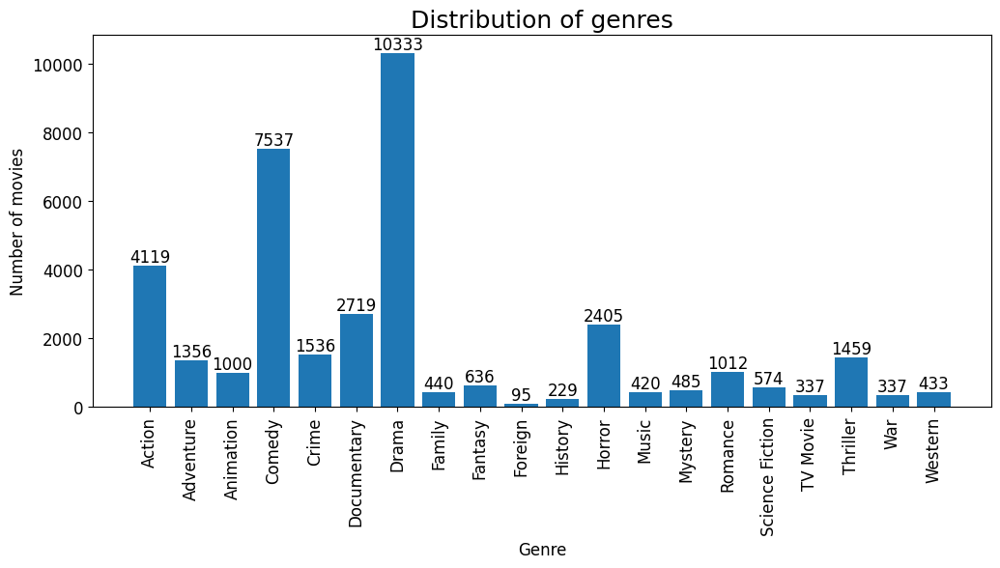

In [599]:
# Plot the distribution of the genres
def plot_genre_distribution(df: pd.DataFrame, genres: list[str], column_name: str = 'first_genre', font_size: int = 12):
    genre_counts = {}
    
    # Initialize genre counts to 0
    for genre in genres:
        genre_counts[genre] = 0
    
    # Count the number of movies in each genre
    for line in df[column_name]:
        # If column_name is 'genres', count the number of movies with each genre
        if column_name == 'genres':
            for genre in line.split('|'):
                genre_counts[genre] += 1
        elif line in genre_counts:
            genre_counts[line] += 1
    
    # Plot the distribution of the genres
    plt.figure(figsize=(12, 5))
    plt.title('Distribution of genres', fontsize=font_size*1.5)
    bars = plt.bar(list(genre_counts.keys()), list(genre_counts.values()))
    
    # Add labels on top of each bar
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.1, int(yval), ha='center', va='bottom', fontsize=font_size)
    
    plt.xticks(rotation=90, fontsize=font_size)
    plt.yticks(fontsize=font_size)
    plt.xlabel('Genre', fontsize=font_size)
    plt.ylabel('Number of movies', fontsize=font_size)
    plt.show()
    
    return genre_counts

genres_count = plot_genre_distribution(movies_clean_df, genres, 'first_genre')

{'Drama': 10333, 'Comedy': 7537, 'Action': 4119, 'Documentary': 2719, 'Horror': 2405, 'Crime': 1536, 'Thriller': 1459, 'Adventure': 1356, 'Romance': 1012, 'Animation': 1000}


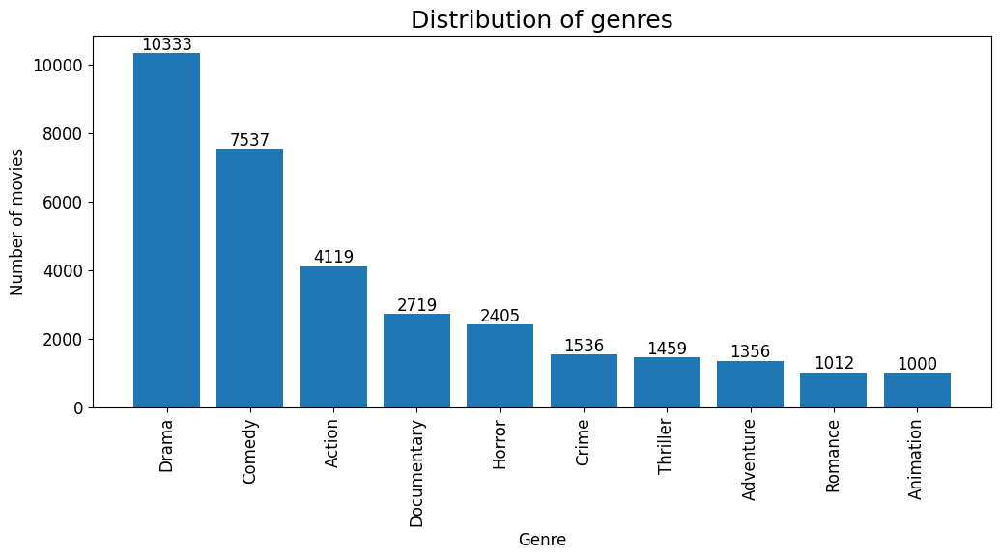

{'Drama': 10333,
 'Comedy': 7537,
 'Action': 4119,
 'Documentary': 2719,
 'Horror': 2405,
 'Crime': 1536,
 'Thriller': 1459,
 'Adventure': 1356,
 'Romance': 1012,
 'Animation': 1000}

In [600]:
GENRES_TO_KEEP = 10

# Keep the dict of genres with the highest counts
top_genres = dict(sorted(genres_count.items(), key=lambda item: item[1], reverse=True)[:GENRES_TO_KEEP])
print(top_genres)

# Remove movies with genres that are not in the top GENRES_TO_KEEP
movies_clean_df = movies_clean_df[movies_clean_df['first_genre'].isin(top_genres.keys())]

# Plot the distribution of the genres
plot_genre_distribution(movies_clean_df, top_genres.keys(), 'first_genre')


In [601]:
# Compute the mean movie per genre
# mean_movies_per_genre = movies_clean_df.groupby('first_genre').count()['title'].mean()
# print("Mean movies per genre :", mean_movies_per_genre)

# Compute the number of movies to keep per genre based on the last element of the top 10 genres
min_movies_per_genre = top_genres[list(top_genres.keys())[-1]]
print("Min movies per genre :", min_movies_per_genre)

# Limit the number of movies per genre to the mean or min
movies_clean_df = movies_clean_df.groupby('first_genre').head(int(min_movies_per_genre))

Min movies per genre : 1000


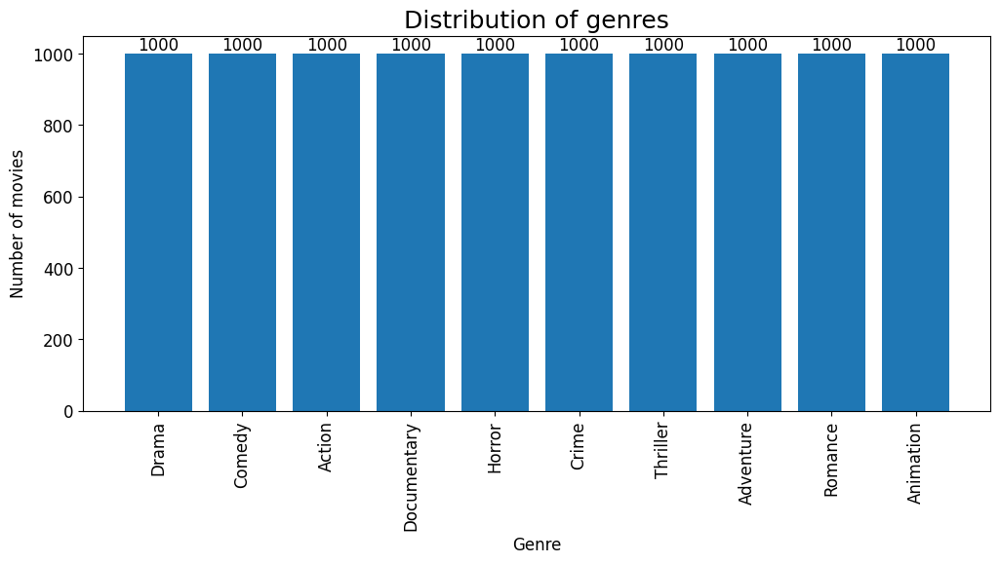

{'Drama': 1000,
 'Comedy': 1000,
 'Action': 1000,
 'Documentary': 1000,
 'Horror': 1000,
 'Crime': 1000,
 'Thriller': 1000,
 'Adventure': 1000,
 'Romance': 1000,
 'Animation': 1000}

In [602]:
# Plot the distribution of the genres
plot_genre_distribution(movies_clean_df, top_genres.keys(), 'first_genre')

In [603]:
# Define POS tags for lemmatization/stemming
EXCLUDED_POS_TAGS = [
    "DT", # determiner
    "PRP", # personal pronoun
    "PRP$", # possessive pronoun
    "WP", # wh-pronoun
    "WP$", # possessive wh-pronoun
    "CD", # cardinal number
    "CC", # coordinating conjunction
    "IN", # preposition or subordinating conjunction
    "PDT", # predeterminer
    "EX", # existential there
    "POS", # genitive marker ('s)
    "$", # currency symbol
    "(", # opening parenthesis
    ")", # closing parenthesis
    ",", # comma
    ".", # sentence terminal
    ":", # colon or ellipsis
    "--", # dash or hyphen
    "``", # opening quotation mark
    "''", # closing quotation mark
    "SYM", # symbol
    "RP", # particle
    # "NNP", # proper noun, singular
    # "NNPS", # proper noun, plural
]

In [604]:
def stemmer(text: str):
  """Stem the text using the SnowballStemmer

  Args:
      text (str): The text to stem
  """
  stemmer = SnowballStemmer(language='english')
  
  # List of stems
  stems = []
  
  for token,tag in pos_tag(word_tokenize(text)):
    print(token, tag)
    if tag in EXCLUDED_POS_TAGS:
      continue
    
    # We remove the stop words
    if token not in STOP_WORDS:

      # Apply stemming on the text
      stems.append(stemmer.stem(token))

  # We return the lems as a string
  return ' '.join(stems)

movies_clean_df['overview_stem'] = movies_clean_df['overview'].apply(stemmer)

Led VBN
by IN
Woody NNP
, ,
Andy NNP
's POS
toys NNS
live VBP
happily RB
in IN
his PRP$
room NN
until IN
Andy NNP
's POS
birthday NN
brings VBZ
Buzz NNP
Lightyear NNP
onto IN
the DT
scene NN
. .
Afraid NNP
of IN
losing VBG
his PRP$
place NN
in IN
Andy NNP
's POS
heart NN
, ,
Woody NNP
plots FW
against IN
Buzz NNP
. .
But CC
when WRB
circumstances NNS
separate VBP
Buzz NNP
and CC
Woody NNP
from IN
their PRP$
owner NN
, ,
the DT
duo NN
eventually RB
learns VBZ
to TO
put VB
aside RP
their PRP$
differences NNS
. .
When WRB
siblings NNS
Judy NNP
and CC
Peter NNP
discover VBP
an DT
enchanted VBN
board NN
game NN
that WDT
opens VBZ
the DT
door NN
to TO
a DT
magical JJ
world NN
, ,
they PRP
unwittingly RB
invite VBP
Alan NNP
-- :
an DT
adult NN
who WP
's VBZ
been VBN
trapped VBN
inside IN
the DT
game NN
for IN
26 CD
years NNS
-- :
into IN
their PRP$
living NN
room NN
. .
Alan NNP
's POS
only JJ
hope NN
for IN
freedom NN
is VBZ
to TO
finish VB
the DT
game NN
, ,
which WDT
proves VBZ
risky JJ
as

Summoned VBN
from IN
an DT
ashram NN
in IN
Tibet NNP
, ,
Ace NNP
finds VBZ
himself PRP
on IN
a DT
perilous JJ
journey NN
into IN
the DT
jungles NNS
of IN
Africa NNP
to TO
find VB
Shikaka NNP
, ,
the DT
missing VBG
sacred VBD
animal NN
of IN
the DT
friendly JJ
Wachati NNP
tribe NN
. .
He PRP
must MD
accomplish VB
this DT
before IN
the DT
wedding NN
of IN
the DT
Wachati NNP
's POS
Princess NNP
to TO
the DT
prince NN
of IN
the DT
warrior JJ
Wachootoos NNP
. .
If IN
Ace NNP
fails VBZ
, ,
the DT
result NN
will MD
be VB
a DT
vicious JJ
tribal JJ
war NN
. .
A DT
vengeful JJ
New NNP
York NNP
transit NN
cop NN
decides VBZ
to TO
steal VB
a DT
trainload NN
of IN
subway JJ
fares NNS
; :
his PRP$
foster NN
brother NN
, ,
a DT
fellow JJ
cop NN
, ,
tries NNS
to TO
protect VB
him PRP
. .
Chili NNP
Palmer NNP
is VBZ
a DT
Miami NNP
mobster NN
who WP
gets VBZ
sent VBN
by IN
his PRP$
boss NN
, ,
the DT
psychopathic JJ
`` ``
Bones NNS
'' ''
Barboni NNP
, ,
to TO
collect VB
a DT
bad JJ
debt NN
from IN
Harry

In [605]:
def lemmatize(text: str):
  """Lemmatize the text

  Args:
      text (str): The text to lemmatize
  """
  wordnet = WordNetLemmatizer()
  
  # List of lems
  lems = []
  
  for token,tag in pos_tag(word_tokenize(text)):
    
    if tag in EXCLUDED_POS_TAGS:
      continue
    
    # We remove the stop words
    if token not in STOP_WORDS:
      pos=tag[0].lower()
      
      # Certains tokens can have a PoS tag that is not recognized by WordNet (e.g. an abbreviation or a typo).
      # In this case, the pos variable is initialized to 'n', which corresponds to the default nominal class of WordNet
      if pos not in ['a', 'r', 'n', 'v']:
          pos='n'
          
      # We add the lem to the list
      lems.append(wordnet.lemmatize(token,pos))
      
  # We return the lems as a string
  return ' '.join(lems)

movies_clean_df['overview_lem'] = movies_clean_df['overview'].apply(lemmatize)

In [606]:
# Remove punctuation characters in the overview
def remove_punctuation(actual_line):
  replace_char = [["'s",""], ["  ", " "]]
  for char in replace_char:
    actual_line = actual_line.replace(char[0], char[1])
    
  print(actual_line)
  return actual_line

movies_clean_df['overview_stem'] = movies_clean_df['overview_stem'].apply(remove_punctuation)
movies_clean_df['overview_lem'] = movies_clean_df['overview_lem'].apply(remove_punctuation)

led woodi andi toy live happili room andi birthday bring buzz lightyear scene afraid lose place andi heart woodi plot buzz circumst separ buzz woodi owner duo eventu learn put differ
when sibl judi peter discov enchant board game open door magic world unwit invit alan adult trap game year live room alan hope freedom finish game prove riski find run giant rhinoceros evil monkey terrifi creatur
cheat mistreat step women hold breath wait elus good man break string less-than-stellar lover friend confid vannah berni glo robin talk determin find better way breath
just georg bank recov daughter wed receiv news pregnant georg wife nina expect plan sell home plan georg chang arriv grandchild kid
obsess master thief neil mccauley lead top-notch crew various insan heist los angel mental unstabl detect vincent hanna pursu rest man recogn respect abil dedic even awar cat-and-mous game may end violenc
ugli duckl undergon remark chang still harbor feel crush carefre playboy business-focus brother som

In [607]:
# Drop rows with empty overview
movies_clean_df = movies_clean_df.drop(movies_clean_df[movies_clean_df['overview'] == ''].index)

In [610]:
# Print all the words and their occurence
get_words_occurence(movies_clean_df, 'overview_stem')
get_words_occurence(movies_clean_df, 'overview_lem')

[('find', 1586), ('life', 1467), ('film', 1385), ('young', 1374), ('new', 1244), ('man', 1225), ('get', 1208), ('year', 1180), ('love', 1173), ('live', 1119), ('friend', 1113), ('take', 1113), ('world', 1053), ('when', 1052), ('stori', 1029), ('famili', 999), ('becom', 985), ('murder', 904), ('make', 793), ('tri', 789), ('time', 787), ('woman', 783), ('old', 766), ('work', 727), ('girl', 687), ('help', 682), ('begin', 676), ('must', 675), ('meet', 674), ('come', 673), ('father', 668), ('way', 661), ('kill', 657), ('day', 652), ('back', 618), ('discov', 614), ('town', 614), ('turn', 613), ('set', 607), ('fall', 603), ('wife', 596), ('home', 572), ('first', 561), ('war', 551), ('forc', 524), ('go', 520), ('son', 517), ('follow', 510), ('want', 508), ('mysteri', 506), ('name', 498), ('death', 495), ('group', 493), ('peopl', 492), ('american', 489), ('soon', 489), ('citi', 486), ('mother', 477), ('secret', 476), ('return', 469), ('decid', 466), ('daughter', 464), ('boy', 459), ('school', 4

In [609]:
# Exporting the dataset
movies_clean_df.to_csv('movies_clean.csv', index=False)